Monday, March 16, 2015
# Show ICC maps based on the NYU TRT data
I want to visualize the ICC files generated by [scores_xp_trt_040315.m](https://github.com/SIMEXP/Projects/blob/master/Scores/Retest/Experiments/scores_xp_trt_040315.m) and that are based on the files generated by [niak_pipeline_stability_scores](https://github.com/SIMEXP/niak/blob/scores/extensions/surfstab/niak_pipeline_stability_scores.m) here: ```ACEWS:/data1/scores/retest/out/icc_maps```

In [35]:
# Get this out of the way, apparently this is necessary now if you want to have any kind of plots
%matplotlib inline

In [82]:
# Imports
import os
import glob
import numpy as np
import nibabel as nib
import brainbox as bb
import matplotlib as mpl
from matplotlib import pyplot as plt

In [150]:
# Paths
in_dir = '/data1/scores/retest/icc_maps/'
out_dir = '/data1/scores/retest/icc_maps/figures'

In [156]:
# Parameters
scales = [7]
scale_tmp = 'sc{:02d}'
metrics = ['dual_regression', 'stability_maps', 'rmap_part']

In [103]:
# Colormaps (because they are hard to come by)
C2 = np.array([[0.1428571429,1,1],
[0.119047619,1,1],
[0.0952380952,1,1],
[0.0714285714,1,1],
[0.0476190476,1,1],
[0.0238095238,1,1],
[0,1,1],
[0,0.9836065574,1],
[0,0.9672131148,1],
[0,0.9508196721,1],
[0,0.9344262295,1],
[0,0.9180327869,1],
[0,0.9016393443,1],
[0,0.8852459016,1],
[0,0.868852459,1],
[0,0.8524590164,1],
[0,0.8360655738,1],
[0,0.8196721311,1],
[0,0.8032786885,1],
[0,0.7868852459,1],
[0,0.7704918033,1],
[0,0.7540983607,1],
[0,0.737704918,1],
[0,0.7213114754,1],
[0,0.7049180328,1],
[0,0.6885245902,1],
[0,0.6721311475,1],
[0,0.6557377049,1],
[0,0.6393442623,1],
[0,0.6229508197,1],
[0,0.606557377,1],
[0,0.5901639344,1],
[0,0.5737704918,1],
[0,0.5573770492,1],
[0,0.5409836066,1],
[0,0.5245901639,1],
[0,0.5081967213,1],
[0,0.4918032787,1],
[0,0.4754098361,1],
[0,0.4590163934,1],
[0,0.4426229508,1],
[0,0.4262295082,1],
[0,0.4098360656,1],
[0,0.393442623,1],
[0,0.3770491803,1],
[0,0.3606557377,1],
[0,0.3442622951,1],
[0,0.3278688525,1],
[0,0.3114754098,1],
[0,0.2950819672,1],
[0,0.2786885246,1],
[0,0.262295082,1],
[0,0.2459016393,1],
[0,0.2295081967,1],
[0,0.2131147541,1],
[0,0.1967213115,1],
[0,0.1803278689,1],
[0,0.1639344262,1],
[0,0.1475409836,1],
[0,0.131147541,1],
[0,0.1147540984,1],
[0,0.0983606557,1],
[0,0.0819672131,1],
[0,0.0655737705,1],
[0,0.0491803279,1],
[0,0.0327868852,1],
[0,0.0163934426,1],
[0,0,1],
[0,0,0.9836065574],
[0,0,0.9672131148],
[0,0,0.9508196721],
[0,0,0.9344262295],
[0,0,0.9180327869],
[0,0,0.9016393443],
[0,0,0.8852459016],
[0,0,0.868852459],
[0,0,0.8524590164],
[0,0,0.8360655738],
[0,0,0.8196721311],
[0,0,0.8032786885],
[0,0,0.7868852459],
[0,0,0.7704918033],
[0,0,0.7540983607],
[0,0,0.737704918],
[0,0,0.7213114754],
[0,0,0.7049180328],
[0,0,0.6885245902],
[0,0,0.6721311475],
[0,0,0.6557377049],
[0,0,0.6393442623],
[0,0,0.6229508197],
[0,0,0.606557377],
[0,0,0.5901639344],
[0,0,0.5737704918],
[0,0,0.5573770492],
[0,0,0.5409836066],
[0,0,0.5245901639],
[0,0,0.5081967213],
[0,0,0.4918032787],
[0,0,0.4754098361],
[0,0,0.4590163934],
[0,0,0.4426229508],
[0,0,0.4262295082],
[0,0,0.4098360656],
[0,0,0.393442623],
[0,0,0.3770491803],
[0,0,0.3606557377],
[0,0,0.3442622951],
[0,0,0.3278688525],
[0,0,0.3114754098],
[0,0,0.2950819672],
[0,0,0.2786885246],
[0,0,0.262295082],
[0,0,0.2459016393],
[0,0,0.2295081967],
[0,0,0.2131147541],
[0,0,0.1967213115],
[0,0,0.1803278689],
[0,0,0.1639344262],
[0,0,0.1475409836],
[0,0,0.131147541],
[0,0,0.1147540984],
[0,0,0.0983606557],
[0,0,0.0819672131],
[0,0,0.0655737705],
[0,0,0.0491803279],
[0,0,0.0327868852],
[0,0,0.0163934426],
[0.0163934426,0,0],
[0.0327868852,0,0],
[0.0491803279,0,0],
[0.0655737705,0,0],
[0.0819672131,0,0],
[0.0983606557,0,0],
[0.1147540984,0,0],
[0.131147541,0,0],
[0.1475409836,0,0],
[0.1639344262,0,0],
[0.1803278689,0,0],
[0.1967213115,0,0],
[0.2131147541,0,0],
[0.2295081967,0,0],
[0.2459016393,0,0],
[0.262295082,0,0],
[0.2786885246,0,0],
[0.2950819672,0,0],
[0.3114754098,0,0],
[0.3278688525,0,0],
[0.3442622951,0,0],
[0.3606557377,0,0],
[0.3770491803,0,0],
[0.393442623,0,0],
[0.4098360656,0,0],
[0.4262295082,0,0],
[0.4426229508,0,0],
[0.4590163934,0,0],
[0.4754098361,0,0],
[0.4918032787,0,0],
[0.5081967213,0,0],
[0.5245901639,0,0],
[0.5409836066,0,0],
[0.5573770492,0,0],
[0.5737704918,0,0],
[0.5901639344,0,0],
[0.606557377,0,0],
[0.6229508197,0,0],
[0.6393442623,0,0],
[0.6557377049,0,0],
[0.6721311475,0,0],
[0.6885245902,0,0],
[0.7049180328,0,0],
[0.7213114754,0,0],
[0.737704918,0,0],
[0.7540983607,0,0],
[0.7704918033,0,0],
[0.7868852459,0,0],
[0.8032786885,0,0],
[0.8196721311,0,0],
[0.8360655738,0,0],
[0.8524590164,0,0],
[0.868852459,0,0],
[0.8852459016,0,0],
[0.9016393443,0,0],
[0.9180327869,0,0],
[0.9344262295,0,0],
[0.9508196721,0,0],
[0.9672131148,0,0],
[0.9836065574,0,0],
[1,0,0],
[1,0.0163934426,0],
[1,0.0327868852,0],
[1,0.0491803279,0],
[1,0.0655737705,0],
[1,0.0819672131,0],
[1,0.0983606557,0],
[1,0.1147540984,0],
[1,0.131147541,0],
[1,0.1475409836,0],
[1,0.1639344262,0],
[1,0.1803278689,0],
[1,0.1967213115,0],
[1,0.2131147541,0],
[1,0.2295081967,0],
[1,0.2459016393,0],
[1,0.262295082,0],
[1,0.2786885246,0],
[1,0.2950819672,0],
[1,0.3114754098,0],
[1,0.3278688525,0],
[1,0.3442622951,0],
[1,0.3606557377,0],
[1,0.3770491803,0],
[1,0.393442623,0],
[1,0.4098360656,0],
[1,0.4262295082,0],
[1,0.4426229508,0],
[1,0.4590163934,0],
[1,0.4754098361,0],
[1,0.4918032787,0],
[1,0.5081967213,0],
[1,0.5245901639,0],
[1,0.5409836066,0],
[1,0.5573770492,0],
[1,0.5737704918,0],
[1,0.5901639344,0],
[1,0.606557377,0],
[1,0.6229508197,0],
[1,0.6393442623,0],
[1,0.6557377049,0],
[1,0.6721311475,0],
[1,0.6885245902,0],
[1,0.7049180328,0],
[1,0.7213114754,0],
[1,0.737704918,0],
[1,0.7540983607,0],
[1,0.7704918033,0],
[1,0.7868852459,0],
[1,0.8032786885,0],
[1,0.8196721311,0],
[1,0.8360655738,0],
[1,0.8524590164,0],
[1,0.868852459,0],
[1,0.8852459016,0],
[1,0.9016393443,0],
[1,0.9180327869,0],
[1,0.9344262295,0],
[1,0.9508196721,0],
[1,0.9672131148,0],
[1,0.9836065574,0],
[1,1,0],
[1,1,0.0238095238],
[1,1,0.0476190476],
[1,1,0.0714285714],
[1,1,0.0952380952],
[1,1,0.119047619],
[1,1,0.1428571429]])
hotcold = mpl.colors.ListedColormap(C2)

In [53]:
# Go get some images for scale 7 and stability_maps
scale = 7
scale_name = scale_tmp.format(scale)
metric = 'dual_regression'
search_path = os.path.join(in_dir, scale_name, 'time', metric, 'volumes/*.nii.gz')
images = glob.glob(search_path)

In [55]:
# Get example data
img = nib.load(images[0])
data = img.get_data()

In [107]:
data.shape

(53, 64, 52, 21)

The ordering here is:  
1, 1,1 - network 1, session12  
2, 1,2 - network 1, session13  
3, 1,3 - network 1, session23  
4, 2,1 - network 2, session12  
...  

In [92]:
mont = bb.visu.make_montage(data[..., 1])

<matplotlib.colorbar.Colorbar instance at 0x8b2ccf8>

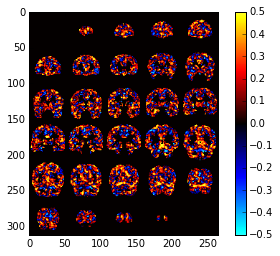

In [106]:
lim = 0.5
plt.imshow(mont, cmap=hotcold, vmax=lim, vmin=-lim)
plt.colorbar()

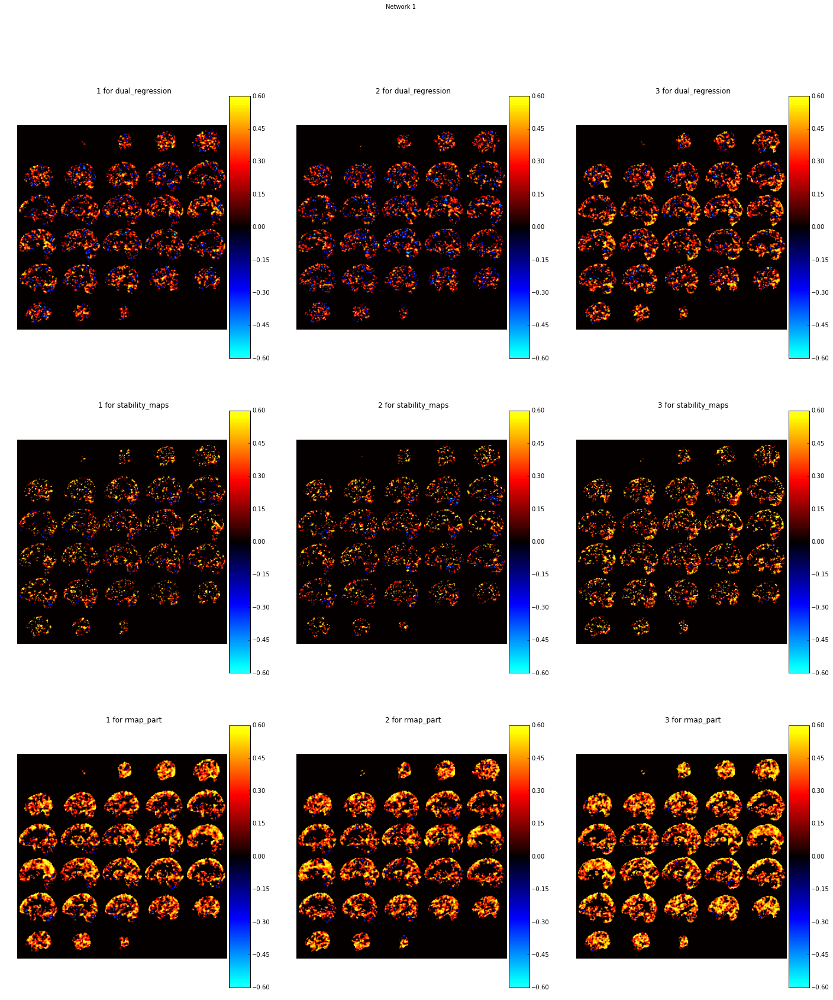

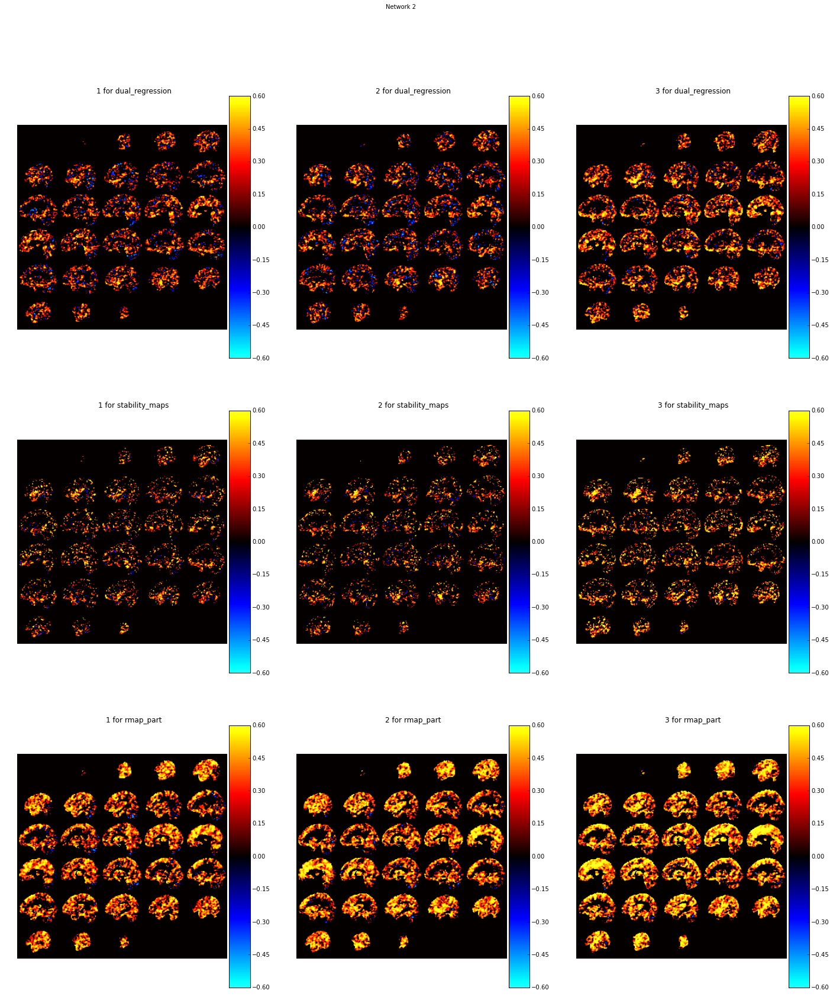

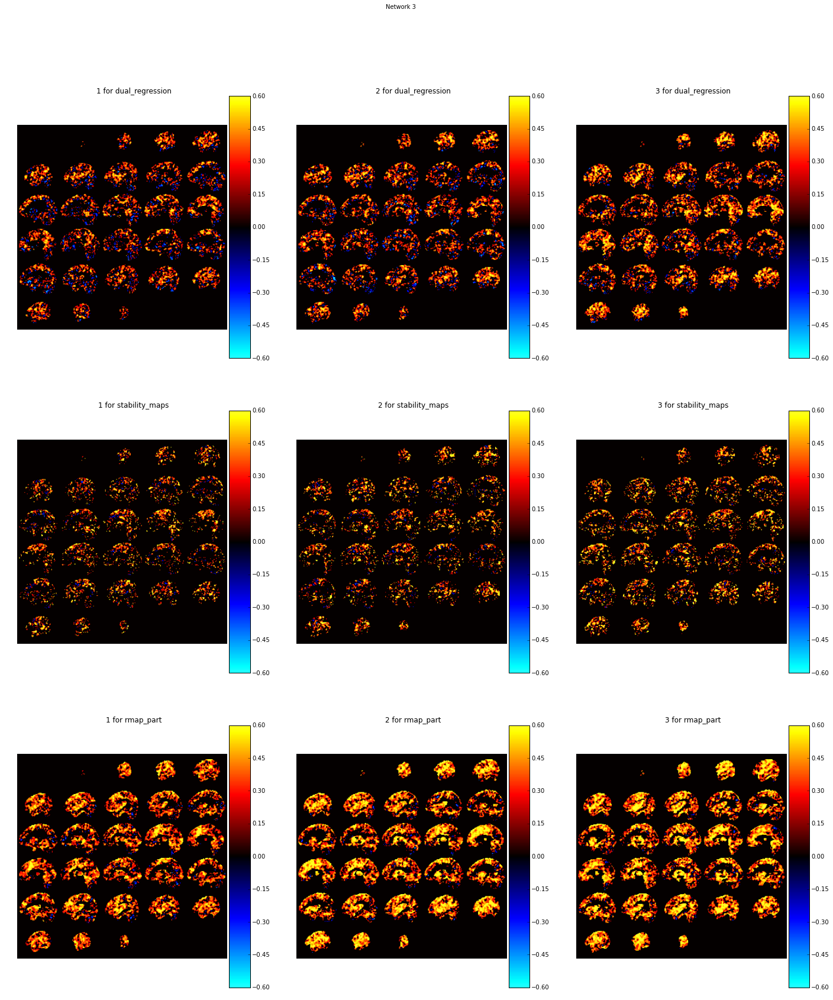

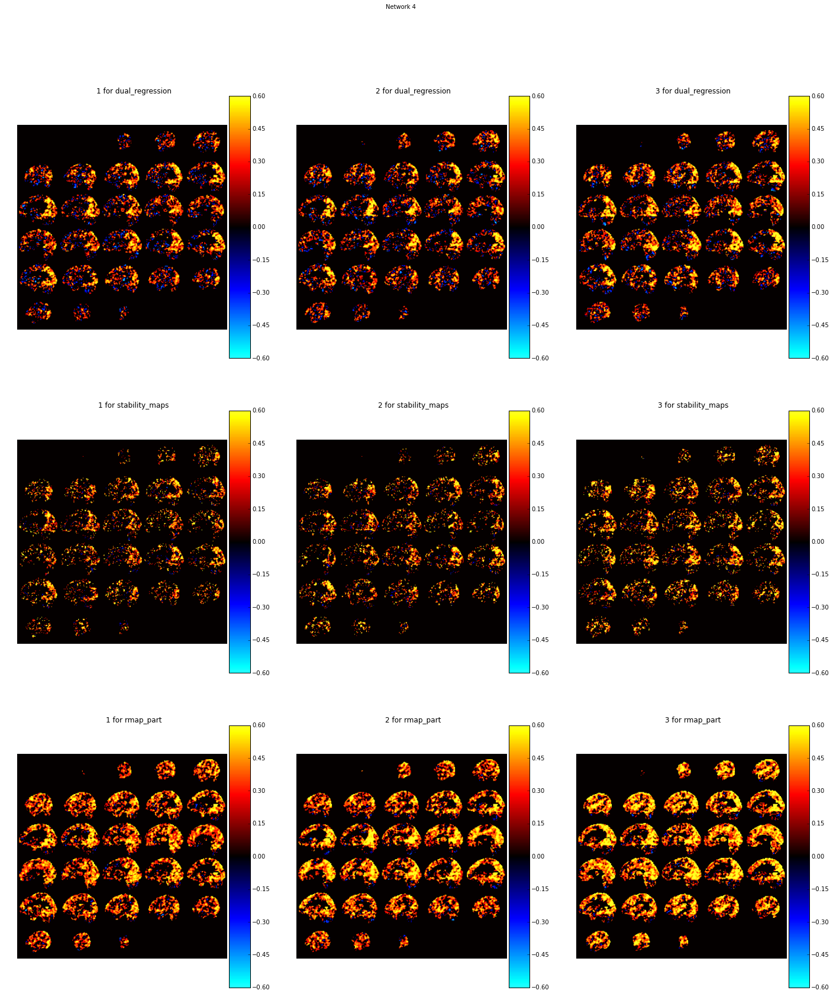

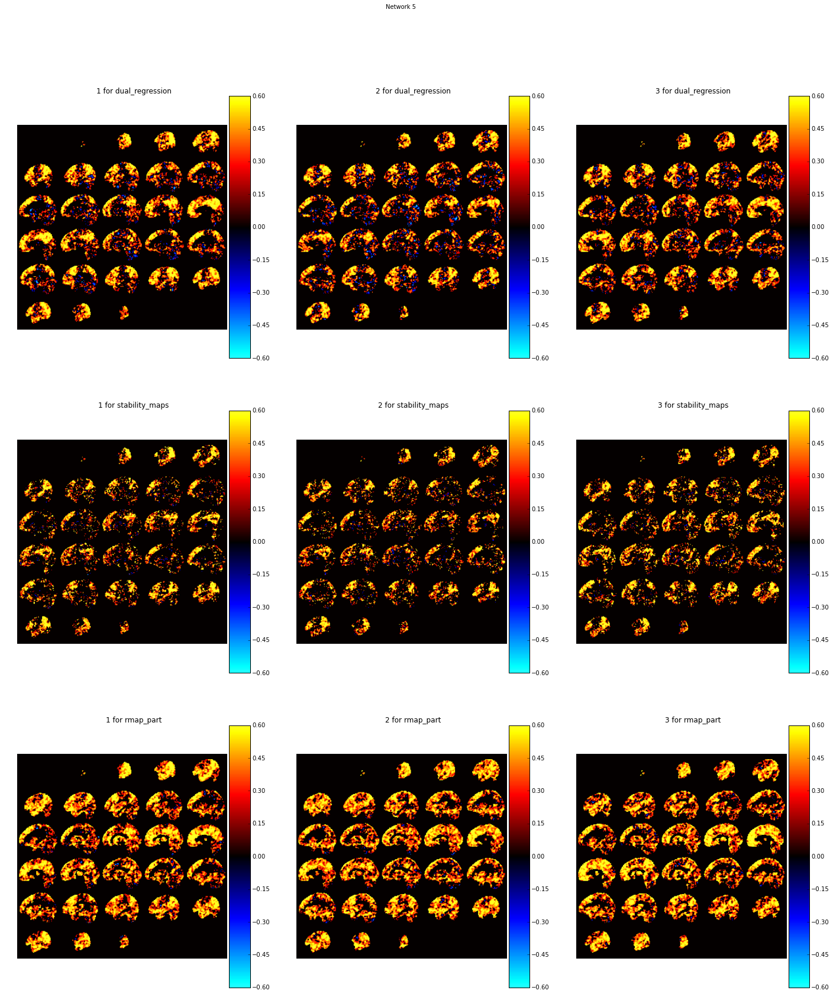

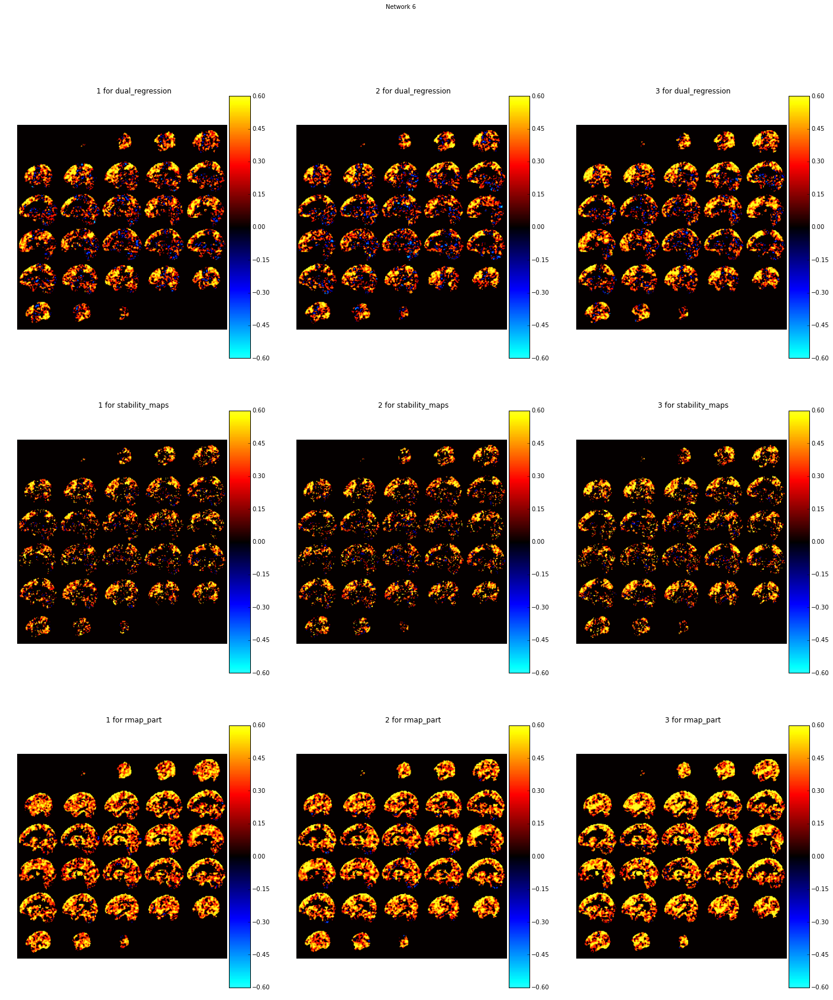

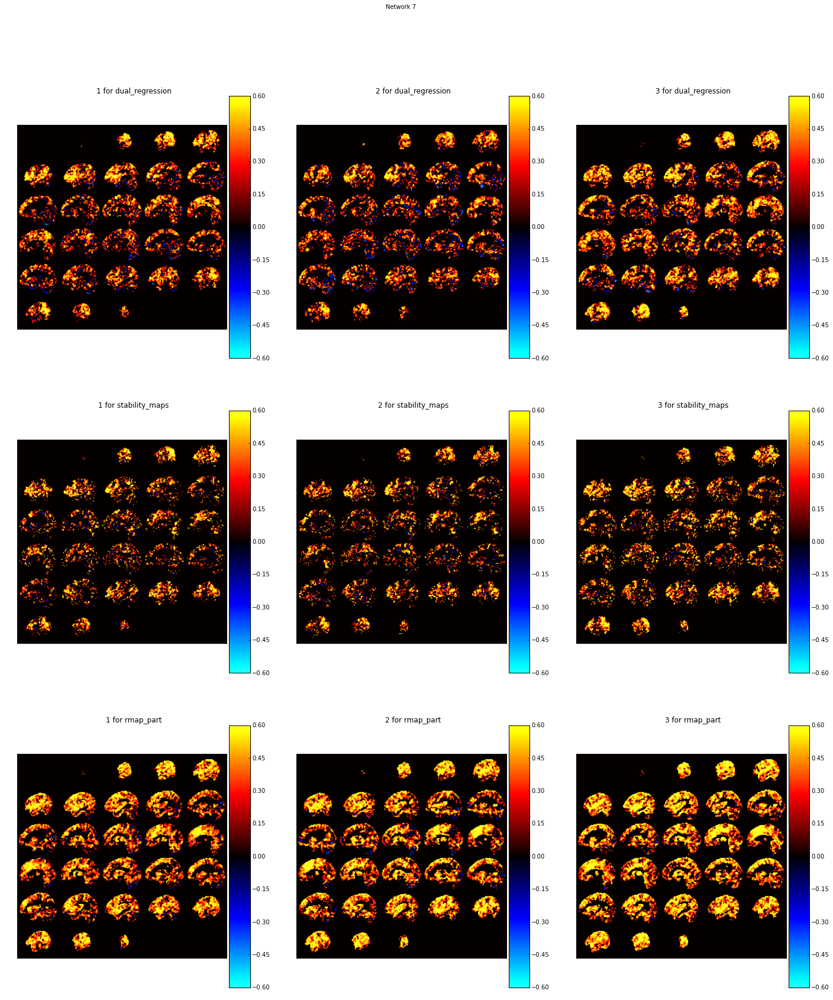

In [161]:
# Lets iterate through all the metrics for one network at one scale
nets = np.arange(0,scale*3,3)
outer = 0.6
inner = 0.2
for net, n_id in enumerate(nets):
    f = plt.figure(figsize=(24,27))
    pos = np.arange(1,10).reshape(3,3)
    for s_id in range(3):
        scale_name = scale_tmp.format(scale)
        for m_id, metric in enumerate(metrics):
            search_path = os.path.join(in_dir, scale_name, 'time', metric, 'volumes/*.nii.gz')
            images = glob.glob(search_path)
            img = nib.load(images[0])
            data = img.get_data()
            p = pos[m_id, s_id]
            d = data[..., n_id+s_id]
            d[np.abs(d)<inner] = 0
            mont = bb.visu.make_montage(d, axis='axial')
            ax = f.add_subplot(3,3,p)
            xm = bb.visu.add_subplot_axes(ax, [0,0,0.9,1], axisbg='w')
            c = xm.imshow(mont, cmap=hotcold, vmax=outer, vmin=-outer)
            xc = bb.visu.add_subplot_axes(ax, [0.91,0,0.09,1], axisbg='w')
            plt.colorbar(c, cax=xc)
            xm.set_axis_off()
            ax.set_axis_off()
            ax.set_title('{} for {}'.format(s_id+1, metric))
    f_name = 'ax_scale_{}_net_{}_overview.png'.format(scale, net+1)
    f_path = os.path.join(out_dir, f_name)
    f.suptitle('Network {}'.format(net+1))
    plt.savefig(f_path, dpi=100)
    

In [ ]:
plt.savefig

In [144]:
net = np.arange(0,scale*3,3)

In [145]:
net

array([ 0,  3,  6,  9, 12, 15, 18])

In [111]:
pos

array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])